## Contour Exercise 

In [1]:
import os
from random import choice
import cv2
from uuid import uuid4
from IPython.display import Image
from IPython.core.display import HTML
import numpy
import matplotlib.pyplot as plt

d

In [2]:
def contour_box(contour):
    x, y, w, h = cv2.boundingRect(contour)
    box = (x, y, w, h)
    return box

In [3]:
def display_image_jupyter(image_path):
    return Image(filename = image_path, 
          width = 1920, 
          height = 939)

In [4]:
def plot_image(image):
    plt.figure(figsize = (50, 15))
    plt.imshow(image)
    plt.show()

In [5]:
test_image_path = './data/20190108_WGS84_S_Mercator_144_98370_-37_90270_144_98628_-37_90171_20.jpg'

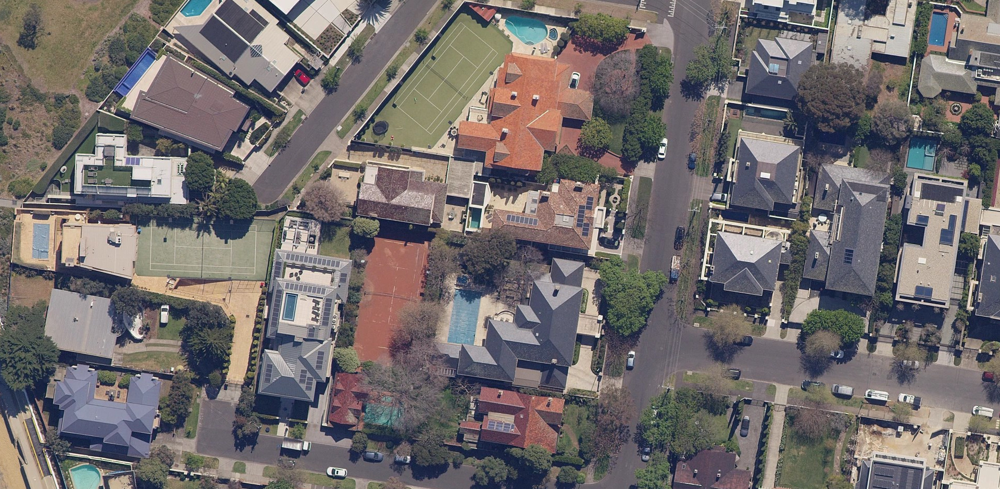

In [6]:
display_image_jupyter(test_image_path)

In [7]:
image = cv2.imread(test_image_path)

## Using HSV space

In [8]:
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

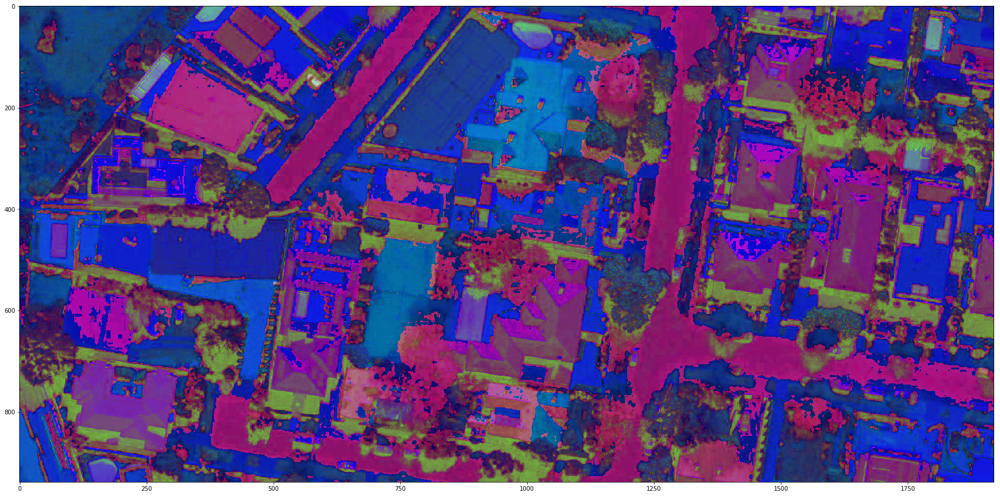

In [9]:
plot_image(hsv_image)

In [10]:
mask = cv2.inRange(hsv_image, 
                   lower_range, 
                   upper_range)

_, contours, _ = cv2.findContours(mask, 
                                  cv2.RETR_TREE, 
                                  cv2.CHAIN_APPROX_SIMPLE)

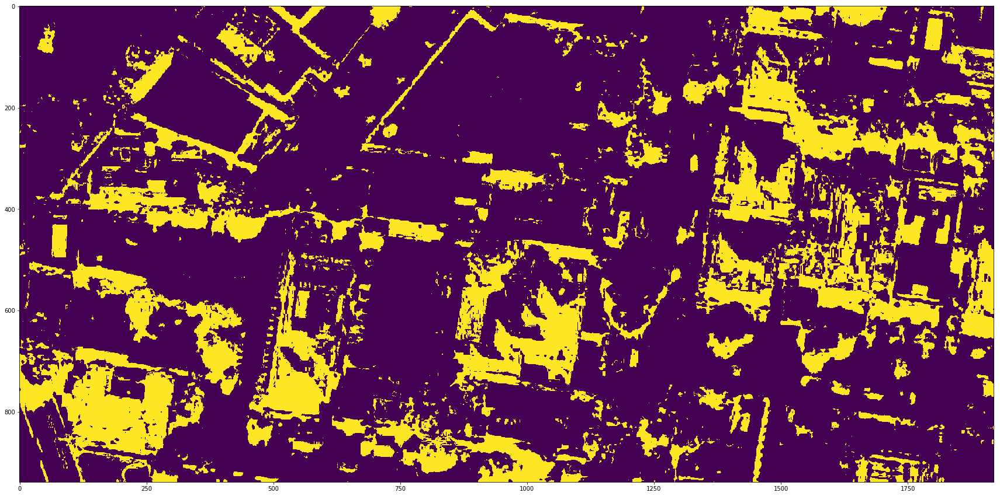

In [11]:
plot_image(mask)

In [12]:
new_contours = [c for c in contours if cv2.contourArea(c) >= 2000]

In [13]:
print('found {} contours after filtering process'.format(len(new_contours)))

found 32 contours after filtering process


### Drawing the original contours

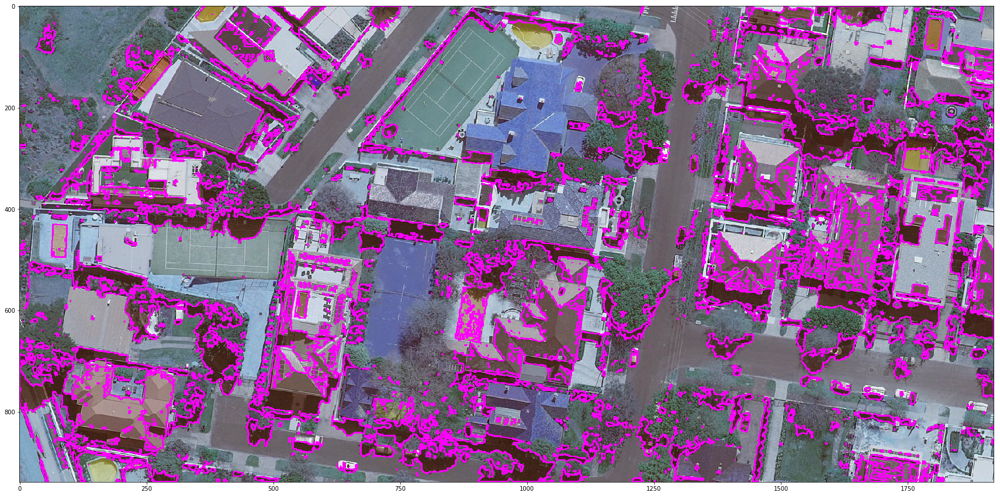

In [14]:
copy = image.copy()
plot_image(cv2.drawContours(copy, contours, -1, (255,0,255), 2))

### Drawing filtered contours

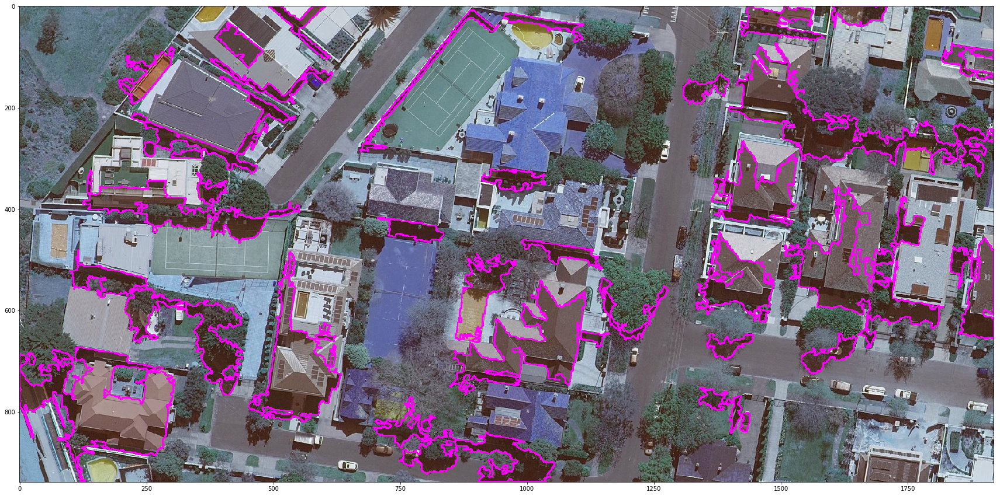

In [15]:
copy = image.copy()
plot_image(cv2.drawContours(copy, new_contours, -1, (255,0,255), 2))

## Drawing bounding boxes

In [16]:
boxes = [contour_box(c) for c in new_contours]

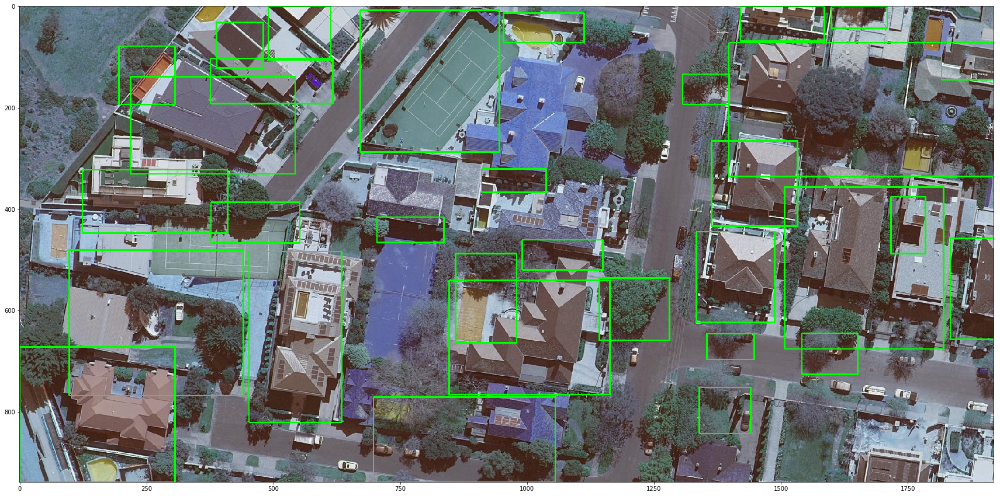

In [17]:
copy = image.copy()
for b in boxes:
    cv2.rectangle(copy, (b[0], b[1]), (b[0] + b[2], b[1] + b[3]), (0, 255, 0), 2)
plot_image(copy)
